# GD3 프로젝트: 자율주행 보조 시스템 만들기

## 자율주행 시스템 만들기

학스노드에서 만든 모델을 통해 아래의 조건을 만족하는 함수를 만들어 주세요.

- 입력으로 이미지 경로를 받습니다.
- 정지조건에 맞는 경우 "Stop" 아닌 경우 "Go"를 반환합니다.
- 조건은 다음과 같습니다.
    - 사람이 한 명 이상 있는 경우
    - 차량의 크기(width or height)가 300px이상인 경우

In [1]:
%matplotlib inline

# automatically reload modules when they have changed
%load_ext autoreload
%autoreload 2

# import keras
import keras

# import keras_retinanet
from keras_retinanet import models
from keras_retinanet.models import load_model
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color
from keras_retinanet.utils.gpu import setup_gpu

# import miscellaneous modules
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import time

gpu = '0'
setup_gpu(gpu)

model_path = os.path.join(os.getenv('HOME'),'aiffel','object_detection','keras-retinanet', 'snapshots', 'resnet50_csv_50_infer.h5')
model = load_model(model_path, backbone_name='resnet50')

1 Physical GPUs, 1 Logical GPUs


[593.2657  175.90425 625.5609  205.4734 ] 0.8454595 0
[190.00241 133.1303  350.3333  235.04112] 0.43969613 0


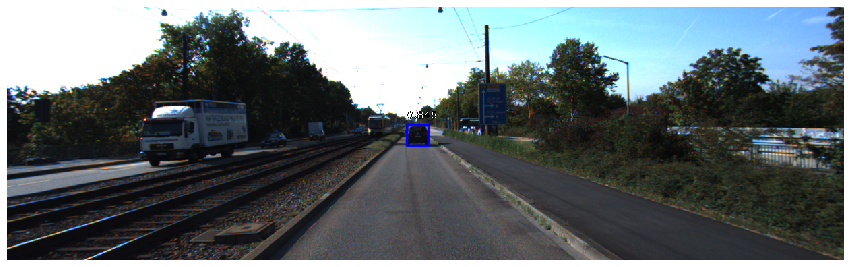

In [14]:
import os
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/go_1.png'

# inference_on_image 함수를 구현해 주세요.
def inference_on_image(model, img_path="./test_set/go_0.png", threshold = 0.5):
    image = read_image_bgr(img_path)

    # copy to draw on
    draw = image.copy()
		# opencv를 통해 불러온 이미지의는 BGR 컬러값을 사용하니까, RGB로 전환
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

		# 박스 색깔 미리 정해놓기
    color_map = {
        0: (0, 0, 255), # blue
        1: (255, 0, 0) # red
    }

    # preprocess image for network
		# kreas_retinanet image util에 포함되어있음 ( preprocess_image, resize_image)
    image = preprocess_image(image)
    image, scale = resize_image(image)

    # process image
		# 추론 진행
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

    # correct for image scale
		# 크기 조정
    boxes /= scale
   
    # @label 0: car, 1: person 
    for box, score, label in zip(boxes[0], scores[0], labels[0]):
        # [x1,y1,x2,y2]
        # width : abs(x2-x1) , height : abs(y2-y1), image 크기에 맞게 스케일 된 값이니 그냥 사용.
        print(box, score, label)
        if score < threshold:
            break
        b = box.astype(int)
        draw_box(draw, b, color=color_map[label])
        # draw_box(draw,[300,200,500,100],color=color_map[1])

        caption = "{:.3f}".format(score)
        draw_caption(draw, b, caption)

    plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.imshow(draw)
    plt.show()

inference_on_image(model, img_path=img_path)

### 임계값을 확 낮추면 어떤 모습일까?

[593.2657  175.90425 625.5609  205.4734 ] 0.8454595 0
[190.00241 133.1303  350.3333  235.04112] 0.43969613 0
[585.8277  174.01688 611.32385 206.81194] 0.15016271 0
[181.80774  92.50553 400.13068 223.94714] 0.10845962 0
[591.2264  168.94029 620.2951  197.9463 ] 0.09962071 0
[375.1376  179.94762 417.1406  205.96301] 0.09163519 0
[238.284   145.40047 382.03186 224.45827] 0.08825947 0
[  0.      193.39503 180.45425 373.6249 ] 0.085044615 0
[215.32298 112.38305 336.60696 208.13606] 0.07705412 0
[  0.      126.2923  464.41504 373.6249 ] 0.07515227 0
[183.33627  86.60578 288.83325 230.51729] 0.074131064 0
[198.45967 135.54259 394.6715  285.0569 ] 0.06923519 0
[197.89621  66.04565 326.15833 191.58163] 0.0682673 0
[149.16165   38.649338 336.16327  221.78702 ] 0.06765949 0
[ 24.961685 234.94452  305.30554  373.6249  ] 0.06526105 0
[218.11891 126.89334 340.37415 249.90941] 0.064292915 1
[167.96428 161.17029 304.68393 247.10759] 0.06232003 0
[ 788.5614   238.40364 1046.1206   373.6249 ] 0.06144034

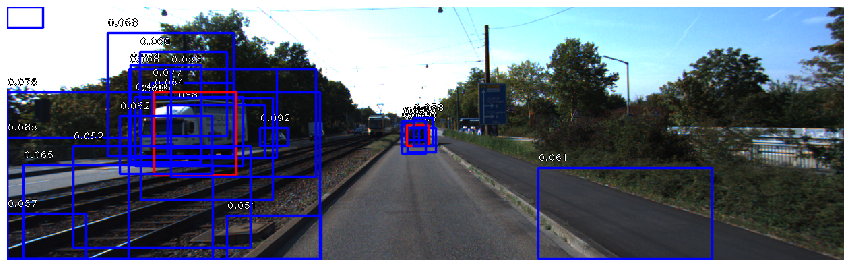

In [31]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/go_1.png'
inference_on_image(model, img_path=img_path, threshold = 0.05)

threshold를 만힝 낮추니까... 난장판이네

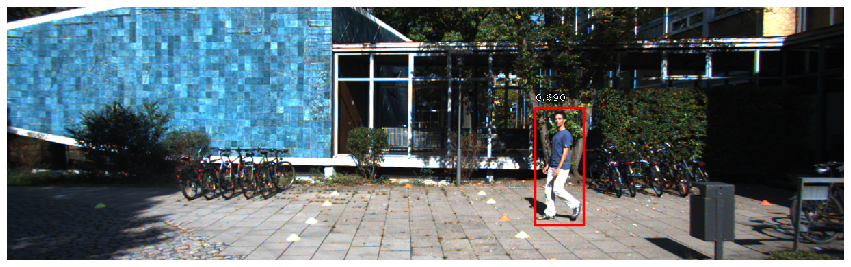

Stop


In [27]:
img_path = os.getenv('HOME')+'/aiffel/object_detection/test_set/stop_1.png'

def self_drive_assist(img_path, size_limit=300, threshold=0.5):
    # 코드 구현
        # 정지조건에 맞으면 return "Stop"
        # 아닌 경우 return "Go"

    image = read_image_bgr(img_path)

     # copy to draw on
    draw = image.copy()
		# opencv를 통해 불러온 이미지의는 BGR 컬러값을 사용하니까, RGB로 전환
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

		# 박스 색깔 미리 정해놓기
    color_map = {
        # car
        0: (0, 0, 255), # blue
        # person        
        1: (255, 255, 0), # yellow

        # Go
        2: (0,255,0), # green
        # Stop
        3: (255,0,0) # red
    }

    # preprocess image for network
		# kreas_retinanet image util에 포함되어있음 ( preprocess_image, resize_image)
    image = preprocess_image(image)
    image, scale = resize_image(image)

    # process image
		# 추론 진행
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))

    # correct for image scale
		# 크기 조정
    boxes /= scale

    threshold = 0.5
    STOP = 'Stop'
    GO = 'Go'
    # print(boxes)
    result = GO
    # @label 0: car, 1: person 
    for box, score, label in zip(boxes[0], scores[0], labels[0]):
        # [x1,y1,x2,y2]
        # width : abs(x2-x1) , height : abs(y2-y1), image 크기에 맞게 스케일 된 값이니 그냥 사용.
        # print(box)
        
        # threshold 미만의 점수를 갖는 결과가 나오면 pass 무시한다.
        # 모르는 상황이 나오면 멈추도록 만드는 것이 맞는 것 같긴 한데... 그렇게 하면 score가 낮게 측정되는 bbox들이 너무 많아서 아예 무조건 다 STOP 나올거같아서 break 대신 continue로 함.
        if score < threshold:
            continue

        width = abs(box[2]-box[0])
        height = abs(box[1]-box[3])

        b = box.astype(int)

        caption = "{:.3f}".format(score)
        draw_caption(draw, b, caption)

        # 앞에 사람이 한 명 이상 있는 경우
        if label == 1:
            draw_box(draw, b, color=color_map[3])
            result = STOP
            break

        # 앞에 차량이 있는데 크기(너비 혹은 높이)가 300 이상인 경우
        elif label == 0 and (width >= 300 or height >=300):
            draw_box(draw, b, color=color_map[3])
            result = STOP
            break    

        draw_box(draw, b, color=color_map[2])

    # 감지된 모든 bbox에 대해 통과한다면! pass    
    plt.figure(figsize=(15, 15))
    plt.axis('off')
    plt.imshow(draw)
    plt.show()
    return result

print(self_drive_assist(img_path, threshold= 0.5))

사람이 한 명 감지되었기 때문에 Stop 결과를 내고 빨간색 사각형(stop 사각형)으로 표시.

## 자율주행 시스템 평가하기
아래 test_system() 를 통해서 위에서 만든 함수를 평가해봅시다. 10장에 대해 Go와 Stop을 맞게 반환하는지 확인하고 100점 만점으로 평가해줍니다.

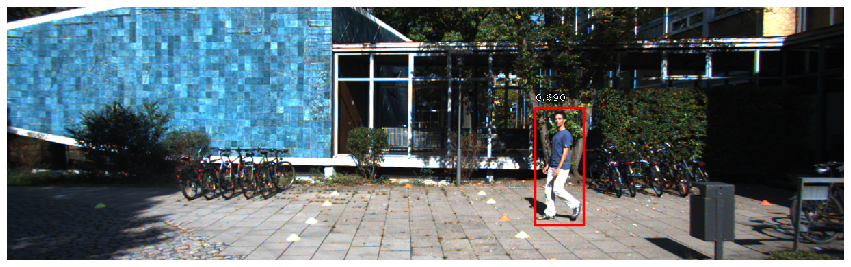

Stop


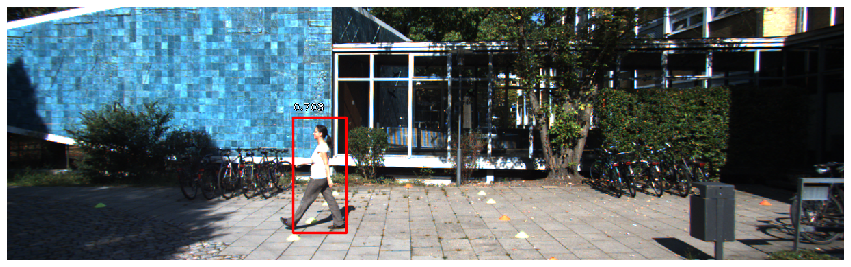

Stop


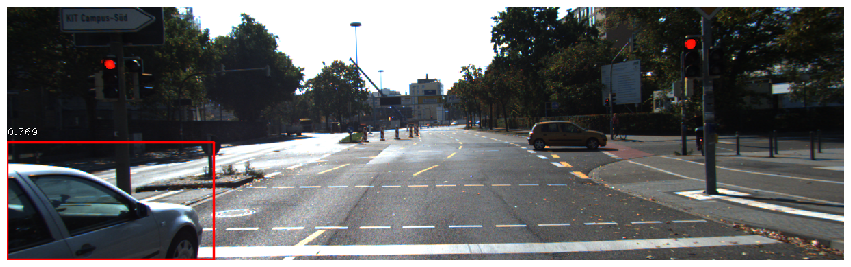

Stop


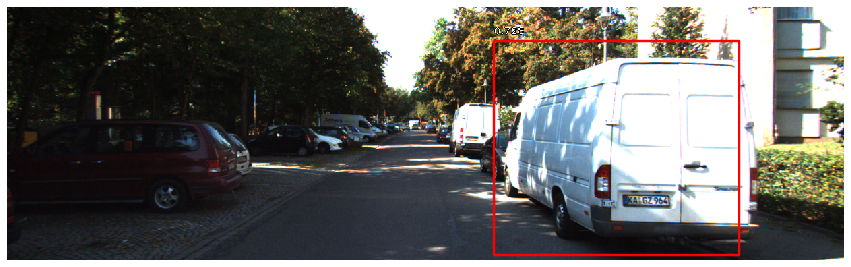

Stop


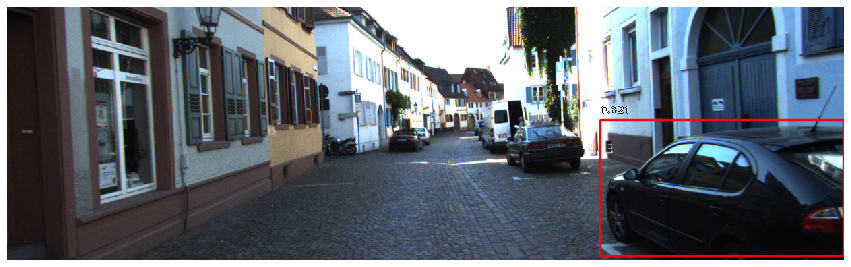

Stop


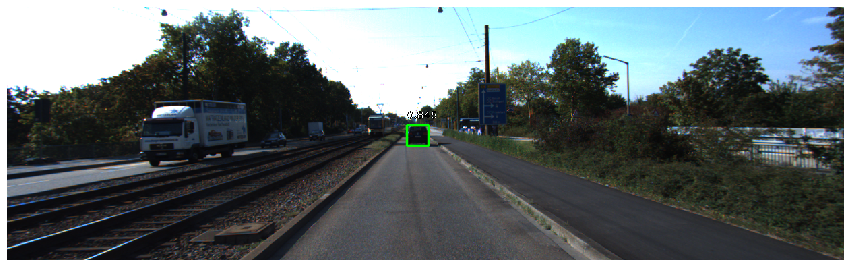

Go


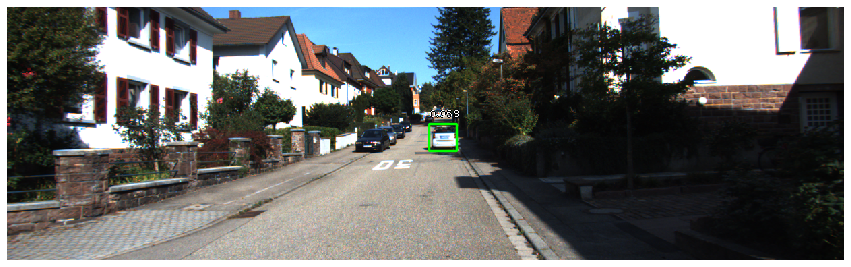

Go


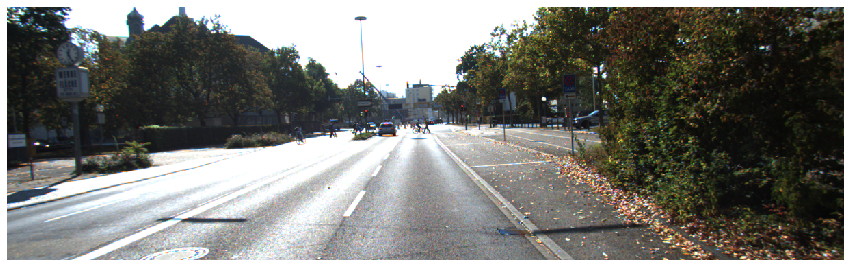

Go


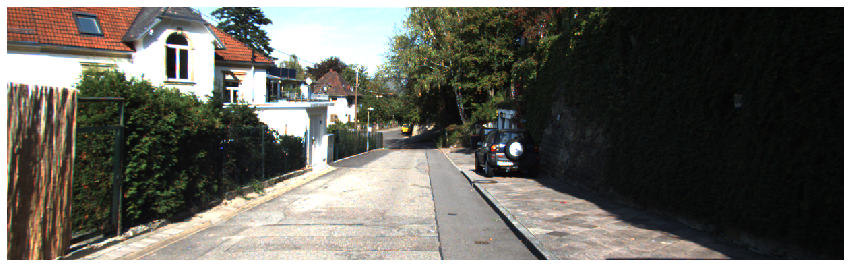

Go


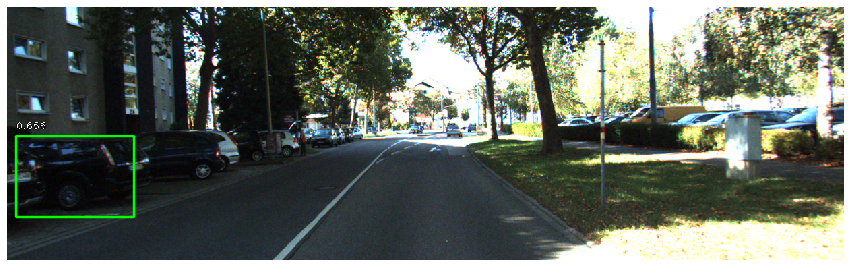

Go
100점입니다.


In [29]:
import os

def test_system(func):
    work_dir = os.getenv('HOME')+'/aiffel/object_detection'
    score = 0
    test_set=[
        ("test_set/stop_1.png", "Stop"),
        ("test_set/stop_2.png", "Stop"),
        ("test_set/stop_3.png", "Stop"),
        ("test_set/stop_4.png", "Stop"),
        ("test_set/stop_5.png", "Stop"),
        ("test_set/go_1.png", "Go"),
        ("test_set/go_2.png", "Go"),
        ("test_set/go_3.png", "Go"),
        ("test_set/go_4.png", "Go"),
        ("test_set/go_5.png", "Go"),
    ]

    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        pred = func(image_path)
        print(pred)
        if pred == answer:
            score += 10
    print(f"{score}점입니다.")

test_system(self_drive_assist)

100점이다 :)

# 결과 보고서

- 긴가민가한 결과 : test 셋에 대해 판별한 결과를 살펴보니, 옆 차선에 차량이 있거나, 갓길에 정차해있는 차량을 인식하고도 멈추라고 하는 것이 조금 의아하였다. 하지만 정답과는 일치한다고 하니 다시 한 번 의아하였다. 아무래도 옆에서 차량이 들어올 수도 있다는 것을 인지하고자 한 것 같은데... 물론 실제로 사용되는 모델은 이것보다 더 정교하리라 생각된다.
- 처음에 자율주행 차량에 대해 생각했을 때, 모르면 일단 멈춰야한다고 생각했는데, 그 '모른다' 라는 점을 설정하기 위해 score threshold를 몇으로 설정해야 하는 것인지 애매하다는 생각도 들었다. 그리고 '모른다' 라고 했을 때, 이번 프로젝트에서는 그냥 무시하는 것으로 결정하고 진행했지만, 현실에서는 마냥 그럴수만은 없겠다는 생각도 들었다.